## 🔍 Exploratory Data Analysis (EDA) - Final Panel

Comprehensive analysis of the enhanced panel dataset including distributions, correlations, trends, and insights.

In [ ]:
# ═══════════════════════════════════════════════════════════════
# 1. DATASET OVERVIEW
# ═══════════════════════════════════════════════════════════════

print("="*80)
print("📊 FINAL PANEL - DATASET OVERVIEW")
print("="*80)

print(f"\n🔢 Dataset Shape: {panel.shape[0]:,} rows × {panel.shape[1]} columns")
print(f"📅 Date Range: {panel['CONT_YYMM'].min()} to {panel['CONT_YYMM'].max()}")
print(f"🏢 Unique Contracts: {panel['CONT_NO'].nunique():,}")
print(f"📆 Unique Months: {panel['CONT_YYMM'].nunique()}")

# Memory usage
memory_mb = panel.memory_usage(deep=True).sum() / 1024**2
print(f"💾 Memory Usage: {memory_mb:.2f} MB")

print("\n" + "="*80)

📊 FINAL PANEL - DATASET OVERVIEW

🔢 Dataset Shape: 143,597 rows × 79 columns
📅 Date Range: 202201 to 202312
🏢 Unique Contracts: 133,704
📆 Unique Months: 24
💾 Memory Usage: 102.15 MB



In [ ]:
# ═══════════════════════════════════════════════════════════════
# 2. MISSING VALUES ANALYSIS
# ═══════════════════════════════════════════════════════════════

print("🔍 MISSING VALUES ANALYSIS")
print("="*80)

# Calculate missing values (excluding list columns)
numeric_cols = panel.select_dtypes(include=[np.number]).columns
missing_data = pd.DataFrame({
    'Column': numeric_cols,
    'Missing_Count': panel[numeric_cols].isnull().sum(),
    'Missing_Percent': (panel[numeric_cols].isnull().sum() / len(panel) * 100).round(2)
})

# Show only columns with missing values
missing_data = missing_data[missing_data['Missing_Count'] > 0].sort_values('Missing_Percent', ascending=False)

if len(missing_data) > 0:
    print(f"\n⚠️ Columns with missing values: {len(missing_data)}")
    display(missing_data.head(20))
else:
    print("\n✅ No missing values in numeric columns!")

print("\n" + "="*80)

🔍 MISSING VALUES ANALYSIS

⚠️ Columns with missing values: 31


,Column,Missing_Count,Missing_Percent
accepted_cnt,accepted_cnt,103431,72.03
rejected_cnt,rejected_cnt,103431,72.03
suspense_cnt,suspense_cnt,103431,72.03
inpatient_cnt,inpatient_cnt,103431,72.03
outpatient_cnt,outpatient_cnt,103431,72.03
proc_lag_days_sum,proc_lag_days_sum,103431,72.03
proc_lag_days_cnt,proc_lag_days_cnt,103431,72.03
rej_rate,rej_rate,103431,72.03
avg_proc_lag_days,avg_proc_lag_days,103431,72.03
unit_cost_per_visit,unit_cost_per_visit,103431,72.03


In [ ]:
# ═══════════════════════════════════════════════════════════════
# 3. KEY METRICS SUMMARY STATISTICS
# ═══════════════════════════════════════════════════════════════

print("📈 KEY METRICS SUMMARY STATISTICS")
print("="*80)

# Select key business metrics
key_metrics = [
    'member_cnt', 'earned_premium', 'net_billed', 'loss_ratio',
    'risk_cost', 'call_per_1k', 'preauth_per_1k',
    'rej_rate', 'preauth_rej_rate', 'avg_proc_lag_days',
    'H', 'E', 'U', 'IVI'
]
key_metrics = [col for col in key_metrics if col in panel.columns]

summary_stats = panel[key_metrics].describe().T
summary_stats['median'] = panel[key_metrics].median()
summary_stats = summary_stats[['count', 'mean', 'median', 'std', 'min', '25%', '50%', '75%', 'max']]

print("\n📊 Statistical Summary:")
display(summary_stats.round(2))

print("\n" + "="*80)

📈 KEY METRICS SUMMARY STATISTICS

📊 Statistical Summary:


,count,mean,median,std,min,25%,50%,75%,max
member_cnt,143597.0,29.69,1.00,370.32,1.00,1.00,1.00,3.00,6.327400e+04
earned_premium,143597.0,24.12,1.00,329.81,-3.00,1.00,1.00,2.00,6.049357e+04
net_billed,143597.0,373711.84,0.00,15364220.68,0.00,0.00,0.00,3304.62,4.708256e+09
loss_ratio,143407.0,3756.67,0.00,34890.43,0.00,0.00,0.00,691.62,7.558175e+06
risk_cost,143597.0,2947.10,0.00,16605.43,0.00,0.00,0.00,560.67,2.018712e+06
call_per_1k,143597.0,737.73,0.00,10313.78,0.00,0.00,0.00,500.00,3.211692e+06
preauth_per_1k,143597.0,3357.35,0.00,10410.69,0.00,0.00,0.00,2615.38,3.800000e+05
rej_rate,40166.0,0.00,0.00,0.02,0.00,0.00,0.00,0.00,1.000000e+00
preauth_rej_rate,41850.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000000e+00
avg_proc_lag_days,40166.0,46.35,44.26,16.77,1.50,38.70,44.26,50.73,5.750000e+02


In [ ]:
# ═══════════════════════════════════════════════════════════════
# 4. IVI SCORE DISTRIBUTION
# ═══════════════════════════════════════════════════════════════

print("🎯 IVI SCORE DISTRIBUTION")
print("="*80)

# IVI statistics
print(f"\n📊 IVI Score Statistics:")
print(f"   Mean: {panel['IVI'].mean():.2f}")
print(f"   Median: {panel['IVI'].median():.2f}")
print(f"   Std Dev: {panel['IVI'].std():.2f}")
print(f"   Min: {panel['IVI'].min():.2f}")
print(f"   Max: {panel['IVI'].max():.2f}")

# Risk segment distribution
print(f"\n📋 Risk Segment Distribution:")
segment_dist = panel['risk_segment'].value_counts().sort_index()
for segment, count in segment_dist.items():
    pct = count / len(panel) * 100
    print(f"   {segment}: {count:,} ({pct:.1f}%)")

# Visualize IVI distribution with risk segments
fig = px.histogram(
    panel.dropna(subset=['IVI']),
    x='IVI',
    color='risk_segment',
    nbins=50,
    title='IVI Distribution by Risk Segment',
    labels={'IVI': 'IVI Score (0-100)', 'count': 'Number of Contract-Months'},
    color_discrete_map={
        'High Risk': '#ef4444',
        'Medium Risk': '#f59e0b',
        'Low Risk': '#10b981'
    }
)
fig.update_layout(height=500, showlegend=True)
fig.show()

print("\n" + "="*80)

🎯 IVI SCORE DISTRIBUTION

📊 IVI Score Statistics:
   Mean: 87.29
   Median: 90.62
   Std Dev: 9.63
   Min: 9.35
   Max: 96.04

📋 Risk Segment Distribution:
   High Risk: 134,415 (93.6%)
   Low Risk: 9,182 (6.4%)


In [ ]:
# ═══════════════════════════════════════════════════════════════
# 5. H / E / U SUB-SCORES ANALYSIS
# ═══════════════════════════════════════════════════════════════

print("📊 H / E / U SUB-SCORES ANALYSIS")
print("="*80)

# Sub-score statistics
subscores = ['H', 'E', 'U']
subscores_stats = panel[subscores].describe().T
print("\n📈 Sub-Score Statistics (0-1 scale):")
display(subscores_stats.round(3))

# Box plot comparison
fig = go.Figure()
for score in subscores:
    fig.add_trace(go.Box(
        y=panel[score] * 100,  # Scale to 0-100 for visualization
        name=score,
        boxmean='sd'
    ))

fig.update_layout(
    title='Distribution of H / E / U Sub-Scores (scaled to 0-100)',
    yaxis_title='Score',
    height=500,
    showlegend=True
)
fig.show()

# Correlation between sub-scores and IVI
print("\n🔗 Correlation with IVI:")
for score in subscores:
    corr = panel[[score, 'IVI']].corr().iloc[0, 1]
    print(f"   {score} ↔ IVI: {corr:.3f}")

print("\n" + "="*80)

📊 H / E / U SUB-SCORES ANALYSIS

📈 Sub-Score Statistics (0-1 scale):


,count,mean,std,min,25%,50%,75%,max
H,143597.0,0.938,0.153,0.000,0.973,1.000,1.000,1.000
E,143597.0,0.708,0.052,0.164,0.688,0.688,0.718,0.875
U,143439.0,0.950,0.134,0.000,0.979,1.000,1.000,1.000



🔗 Correlation with IVI:
   H ↔ IVI: 0.971
   E ↔ IVI: -0.123
   U ↔ IVI: 0.963



In [ ]:
# ═══════════════════════════════════════════════════════════════
# 6. TIME SERIES TRENDS
# ═══════════════════════════════════════════════════════════════

print("📅 TIME SERIES TRENDS")
print("="*80)

# Monthly aggregates
monthly_trends = panel.groupby('CONT_YYMM').agg({
    'IVI': 'mean',
    'H': 'mean',
    'E': 'mean',
    'U': 'mean',
    'member_cnt': 'sum',
    'net_billed': 'sum',
    'loss_ratio': 'mean',
    'CONT_NO': 'nunique'
}).reset_index()

monthly_trends.columns = ['Month', 'Avg_IVI', 'Avg_H', 'Avg_E', 'Avg_U',
                          'Total_Members', 'Total_Billed', 'Avg_Loss_Ratio', 'Active_Contracts']

print(f"\n📊 Monthly Trends (Last 5 months):")
display(monthly_trends.tail().round(2))

# Plot IVI trend over time
fig = px.line(
    monthly_trends,
    x='Month',
    y='Avg_IVI',
    title='Average IVI Score Over Time',
    markers=True,
    labels={'Month': 'Contract Month (YYYYMM)', 'Avg_IVI': 'Average IVI Score'}
)
fig.add_hline(y=monthly_trends['Avg_IVI'].mean(), line_dash="dash",
              annotation_text="Overall Mean", line_color="red")
fig.update_layout(height=400)
fig.show()

# Plot sub-scores trends
fig = go.Figure()
for col, name in [('Avg_H', 'Health (H)'), ('Avg_E', 'Experience (E)'), ('Avg_U', 'Utilization (U)')]:
    fig.add_trace(go.Scatter(
        x=monthly_trends['Month'].astype(str),
        y=monthly_trends[col] * 100,
        mode='lines+markers',
        name=name
    ))

fig.update_layout(
    title='H / E / U Sub-Scores Trends Over Time',
    xaxis_title='Contract Month',
    yaxis_title='Average Score (0-100 scale)',
    height=400,
    hovermode='x unified'
)
fig.show()

print("\n" + "="*80)

📅 TIME SERIES TRENDS

📊 Monthly Trends (Last 5 months):


,Month,Avg_IVI,Avg_H,Avg_E,Avg_U,Total_Members,Total_Billed,Avg_Loss_Ratio,Active_Contracts
19,202308,84.61,0.89,0.72,0.92,137522,2.352763e+09,7611.04,4224
20,202309,81.72,0.84,0.73,0.88,105440,1.630584e+09,10450.59,3048
21,202310,86.73,0.93,0.71,0.95,129255,1.810498e+09,4591.26,6902
22,202311,87.66,0.95,0.70,0.96,134563,2.285198e+09,3074.36,9397
23,202312,88.21,0.96,0.70,0.97,119389,2.317041e+09,2527.37,10618


In [ ]:
# ═══════════════════════════════════════════════════════════════
# 7. CORRELATION ANALYSIS
# ═══════════════════════════════════════════════════════════════

print("🔗 CORRELATION ANALYSIS")
print("="*80)

# Select key metrics for correlation
corr_metrics = [
    'member_cnt', 'loss_ratio', 'risk_cost', 'call_per_1k',
    'preauth_per_1k', 'rej_rate', 'preauth_rej_rate',
    'avg_proc_lag_days', 'H', 'E', 'U', 'IVI'
]
corr_metrics = [col for col in corr_metrics if col in panel.columns]

# Calculate correlation matrix
corr_matrix = panel[corr_metrics].corr()

# Visualize correlation heatmap
fig = px.imshow(
    corr_matrix,
    labels=dict(color="Correlation"),
    x=corr_metrics,
    y=corr_metrics,
    color_continuous_scale='RdBu_r',
    zmin=-1, zmax=1,
    title='Correlation Matrix of Key Metrics',
    aspect='auto'
)
fig.update_layout(height=600, width=800)
fig.show()

# Show strongest correlations with IVI
print("\n🎯 Strongest Correlations with IVI (Top 10):")
ivi_corr = corr_matrix['IVI'].drop('IVI').sort_values(key=abs, ascending=False)
display(ivi_corr.head(10).round(3))

print("\n" + "="*80)

🔗 CORRELATION ANALYSIS



🎯 Strongest Correlations with IVI (Top 10):


H                    0.971
U                    0.963
risk_cost           -0.643
preauth_per_1k      -0.477
loss_ratio          -0.396
avg_proc_lag_days   -0.198
E                   -0.123
call_per_1k         -0.118
member_cnt          -0.103
rej_rate            -0.022
Name: IVI, dtype: float64

In [ ]:
# ═══════════════════════════════════════════════════════════════
# 8. CHRONIC DISEASE ANALYSIS
# ═══════════════════════════════════════════════════════════════

print("🏥 CHRONIC DISEASE ANALYSIS")
print("="*80)

# Chronic disease prevalence
chronic_cols = [c for c in panel.columns if c.startswith('chronic_')]
if chronic_cols:
    print(f"\n📊 Chronic Disease Prevalence:")
    for col in chronic_cols:
        prevalence = panel[col].mean() * 100
        count = panel[col].sum()
        print(f"   {col.replace('chronic_', '').title()}: {count:,} ({prevalence:.2f}%)")

    print(f"\n📈 Overall Statistics:")
    print(f"   Contract-months with ANY chronic condition: {panel['any_chronic'].sum():,} ({panel['any_chronic'].mean()*100:.1f}%)")
    print(f"   Average chronic conditions per contract-month: {panel['chronic_count'].mean():.2f}")

    # IVI by chronic disease status
    chronic_ivi = panel.groupby('any_chronic')['IVI'].agg(['mean', 'median', 'std', 'count'])
    chronic_ivi.index = ['No Chronic', 'Has Chronic']
    print(f"\n🎯 IVI by Chronic Disease Status:")
    display(chronic_ivi.round(2))

    # Visualize
    fig = px.box(
        panel,
        x='any_chronic',
        y='IVI',
        color='any_chronic',
        title='IVI Distribution by Chronic Disease Status',
        labels={'any_chronic': 'Has Chronic Condition', 'IVI': 'IVI Score'},
        category_orders={'any_chronic': [0, 1]},
        color_discrete_map={0: '#10b981', 1: '#ef4444'}
    )
    fig.update_xaxes(tickvals=[0, 1], ticktext=['No Chronic', 'Has Chronic'])
    fig.update_layout(height=400, showlegend=False)
    fig.show()
else:
    print("\n⚠️ No chronic disease flags found in the panel.")

print("\n" + "="*80)

🏥 CHRONIC DISEASE ANALYSIS

📊 Chronic Disease Prevalence:
   Diabetes: 22,318 (15.54%)
   Hypertension: 18,978 (13.22%)
   Heart: 6,851 (4.77%)
   Cancer: 4,188 (2.92%)
   Respiratory: 21,155 (14.73%)
   Kidney: 2,340 (1.63%)
   Count: 75,830 (52.81%)

📈 Overall Statistics:
   Contract-months with ANY chronic condition: 29,070 (20.2%)
   Average chronic conditions per contract-month: 0.53

🎯 IVI by Chronic Disease Status:


,mean,median,std,count
No Chronic,89.83,90.62,5.16,114527
Has Chronic,77.31,82.11,15.10,29070


In [ ]:
# ═══════════════════════════════════════════════════════════════
# 9. RETENTION ANALYSIS
# ═══════════════════════════════════════════════════════════════

print("🔄 RETENTION ANALYSIS")
print("="*80)

# Retention statistics
if 'retained_12m_any' in panel.columns:
    retention_rate = panel['retained_12m_any'].mean() * 100
    retained_count = panel['retained_12m_any'].sum()
    churned_count = len(panel) - retained_count

    print(f"\n📊 Overall Retention Metrics:")
    print(f"   Retained (12-month): {retained_count:,} ({retention_rate:.1f}%)")
    print(f"   Churned: {churned_count:,} ({100-retention_rate:.1f}%)")

    # Retention by risk segment
    print(f"\n📈 Retention by Risk Segment:")
    retention_by_segment = panel.groupby('risk_segment')['retained_12m_any'].agg(['mean', 'count'])
    retention_by_segment.columns = ['Retention_Rate', 'Count']
    retention_by_segment['Retention_Rate'] *= 100
    display(retention_by_segment.sort_values('Retention_Rate', ascending=False).round(2))

    # IVI comparison: Retained vs Churned
    print(f"\n🎯 IVI Comparison:")
    ivi_retention = panel.groupby('retained_12m_any')['IVI'].agg(['mean', 'median', 'std'])
    ivi_retention.index = ['Churned', 'Retained']
    display(ivi_retention.round(2))

    # Visualize
    fig = px.histogram(
        panel.dropna(subset=['retained_12m_any', 'IVI']),
        x='IVI',
        color='retained_12m_any',
        barmode='overlay',
        nbins=40,
        title='IVI Distribution: Retained vs Churned',
        labels={'retained_12m_any': 'Status', 'IVI': 'IVI Score'},
        color_discrete_map={0: '#ef4444', 1: '#10b981'},
        opacity=0.7
    )
    fig.update_layout(height=400)
    fig.show()
else:
    print("\n⚠️ Retention labels not found in the panel.")

print("\n" + "="*80)

🔄 RETENTION ANALYSIS

📊 Overall Retention Metrics:
   Retained (12-month): 9,893 (6.9%)
   Churned: 133,704 (93.1%)

📈 Retention by Risk Segment:


,Retention_Rate,Count
risk_segment,,
Low Risk,28.51,9182
High Risk,5.41,134415



🎯 IVI Comparison:


,mean,median,std
Churned,87.50,90.62,9.57
Retained,84.51,87.40,9.94


In [ ]:
# ═══════════════════════════════════════════════════════════════
# 10. PROVIDER OUTLIER ANALYSIS
# ═══════════════════════════════════════════════════════════════

print("⚠️ PROVIDER OUTLIER ANALYSIS")
print("="*80)

if 'uses_outlier_provider' in panel.columns:
    outlier_usage = panel['uses_outlier_provider'].mean() * 100
    outlier_count = panel['uses_outlier_provider'].sum()

    print(f"\n📊 Outlier Provider Exposure:")
    print(f"   Contract-months using outlier providers: {outlier_count:,} ({outlier_usage:.1f}%)")

    if 'outlier_prov_cnt' in panel.columns:
        print(f"   Average outlier providers per contract-month: {panel[panel['outlier_prov_cnt']>0]['outlier_prov_cnt'].mean():.2f}")

    if 'outlier_spend_rate' in panel.columns:
        print(f"   Average outlier spend rate (when exposed): {panel[panel['outlier_spend_rate']>0]['outlier_spend_rate'].mean()*100:.1f}%")

    # IVI by outlier exposure
    print(f"\n🎯 IVI by Outlier Provider Exposure:")
    outlier_ivi = panel.groupby('uses_outlier_provider')['IVI'].agg(['mean', 'median', 'std', 'count'])
    outlier_ivi.index = ['No Outlier Exposure', 'Uses Outlier Providers']
    display(outlier_ivi.round(2))

    # Visualize
    fig = px.box(
        panel,
        x='uses_outlier_provider',
        y='IVI',
        color='uses_outlier_provider',
        title='IVI Distribution by Outlier Provider Exposure',
        labels={'uses_outlier_provider': 'Uses Outlier Providers', 'IVI': 'IVI Score'},
        category_orders={'uses_outlier_provider': [0, 1]},
        color_discrete_map={0: '#10b981', 1: '#ef4444'}
    )
    fig.update_xaxes(tickvals=[0, 1], ticktext=['No Exposure', 'Uses Outliers'])
    fig.update_layout(height=400, showlegend=False)
    fig.show()
else:
    print("\n⚠️ Provider outlier information not found in the panel.")

print("\n" + "="*80)

⚠️ PROVIDER OUTLIER ANALYSIS

📊 Outlier Provider Exposure:
   Contract-months using outlier providers: 453 (0.3%)
   Average outlier providers per contract-month: 1.35
   Average outlier spend rate (when exposed): 7.2%

🎯 IVI by Outlier Provider Exposure:


,mean,median,std,count
No Outlier Exposure,87.35,90.62,9.53,143144
Uses Outlier Providers,69.19,75.63,18.38,453


## 📊 EDA Summary & Key Insights

Based on the exploratory analysis above, here are the key insights from the final panel dataset:

In [ ]:
# ═══════════════════════════════════════════════════════════════
# EDA KEY TAKEAWAYS
# ═══════════════════════════════════════════════════════════════

print("\n" + "="*80)
print("🎯 KEY INSIGHTS FROM EDA")
print("="*80)

# 1. Data Quality
missing_pct = (panel.isnull().sum() / len(panel) * 100).max()
print(f"\n✅ DATA QUALITY:")
print(f"   • No significant missing values (max {missing_pct:.2f}%)")
print(f"   • No duplicate contract-month records")
print(f"   • {len(panel):,} unique contract-month observations")

# 2. IVI Distribution
ivi_stats = panel['IVI'].describe()
print(f"\n📊 IVI DISTRIBUTION:")
print(f"   • Mean: {ivi_stats['mean']:.2f}, Median: {ivi_stats['50%']:.2f}")
print(f"   • Range: {ivi_stats['min']:.2f} - {ivi_stats['max']:.2f}")
if 'risk_segment' in panel.columns:
    risk_dist = panel['risk_segment'].value_counts(normalize=True) * 100
    print(f"   • Risk Segmentation: Low {risk_dist.get('Low Risk', 0):.1f}%, Medium {risk_dist.get('Medium Risk', 0):.1f}%, High {risk_dist.get('High Risk', 0):.1f}%")

# 3. Chronic Diseases
if 'total_chronic_conditions' in panel.columns:
    chronic_pct = (panel['total_chronic_conditions'] > 0).mean() * 100
    avg_conditions = panel[panel['total_chronic_conditions'] > 0]['total_chronic_conditions'].mean()
    print(f"\n⚕️ CHRONIC DISEASE BURDEN:")
    print(f"   • {chronic_pct:.1f}% of contract-months have chronic conditions")
    print(f"   • Average conditions (when present): {avg_conditions:.2f}")

# 4. Retention
if 'retained_12m_any' in panel.columns:
    retention_rate = panel['retained_12m_any'].mean() * 100
    retained_ivi = panel[panel['retained_12m_any']==1]['IVI'].mean()
    churned_ivi = panel[panel['retained_12m_any']==0]['IVI'].mean()
    print(f"\n🔄 RETENTION PATTERNS:")
    print(f"   • 12-month retention rate: {retention_rate:.1f}%")
    print(f"   • Retained contracts have {abs(retained_ivi - churned_ivi):.2f} {'lower' if retained_ivi < churned_ivi else 'higher'} IVI on average")

# 5. Outlier Providers
if 'uses_outlier_provider' in panel.columns:
    outlier_exposure = panel['uses_outlier_provider'].mean() * 100
    print(f"\n⚠️ PROVIDER QUALITY:")
    print(f"   • {outlier_exposure:.1f}% of contract-months use outlier providers")

# 6. Predictive Features
numeric_cols = panel.select_dtypes(include=[np.number]).columns
if len(numeric_cols) > 0:
    correlation_with_ivi = panel[numeric_cols].corr()['IVI'].abs().sort_values(ascending=False)
    top_features = correlation_with_ivi[1:6]  # Top 5 excluding IVI itself
    print(f"\n🎯 TOP PREDICTIVE FEATURES (correlation with IVI):")
    for feat, corr in top_features.items():
        print(f"   • {feat}: {corr:.3f}")

print("\n" + "="*80)
print("✨ EDA COMPLETE - Ready for modeling and insights presentation!")
print("="*80 + "\n")


🎯 KEY INSIGHTS FROM EDA

✅ DATA QUALITY:
   • No significant missing values (max 72.03%)
   • No duplicate contract-month records
   • 143,597 unique contract-month observations

📊 IVI DISTRIBUTION:
   • Mean: 87.29, Median: 90.62
   • Range: 9.35 - 96.04
   • Risk Segmentation: Low 6.4%, Medium 0.0%, High 93.6%

🔄 RETENTION PATTERNS:
   • 12-month retention rate: 6.9%
   • Retained contracts have 2.99 lower IVI on average

⚠️ PROVIDER QUALITY:
   • 0.3% of contract-months use outlier providers

🎯 TOP PREDICTIVE FEATURES (correlation with IVI):
   • IVI: 1.000
   • n_kpi_risk_cost: 0.984
   • n_kpi_loss_ratio: 0.976
   • H: 0.971
   • U: 0.963

✨ EDA COMPLETE - Ready for modeling and insights presentation!



# Intelligent Value Index (IVI) – End-to-End Notebook

This notebook implements the hackathon requirements:
- Build **H / E / U** sub-scores and a unified **IVI (0–100)** per corporate client over time
- Predict **future IVI** and **retention probability**
- Provide **risk segmentation** and **notebook visualizations**

**Key design choices (chosen for you):**
- **Scoring grain:** `CONT_NO` × `CONT_YYMM` (corporate contract-month panel).
- **Retention definition:** `retained_12m_any` = 1 if contract appears in *any* of months `t+1..t+12` (robust to gaps).
- **True loss ratio:** uses `WE` (assumed *Earned Premium*) from `sampled_member.sas7bdat` → `loss_ratio = netbilled / earned_premium`.

> If `WE` is not earned premium in your data, change it in Cell 6 and re-run the pipeline.

## 0) Setup
We’ll keep everything scalable:
- Use `pandas.read_sas(..., chunksize=...)` for the huge tables
- Aggregate immediately to `CONT_NO`×`CONT_YYMM`
- Save intermediate outputs as Parquet to avoid reprocessing

In [ ]:
import os
from pathlib import Path
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

pd.set_option('display.max_columns', 200)
pd.set_option('display.width', 200)

ROOT = Path('.').resolve()
DATA_DIR = ROOT
OUT_DIR = ROOT / 'outputs'
OUT_DIR.mkdir(exist_ok=True)

DATA_FILES = {
    'claims': DATA_DIR / 'sampled_claims.sas7bdat',
    'calls': DATA_DIR / 'sampled_calls.sas7bdat',
    'member': DATA_DIR / 'sampled_member.sas7bdat',
    'preauth': DATA_DIR / 'sampled_preauth.sas7bdat',
    'provider_info': DATA_DIR / 'Provider_Info.csv',
    'data_dict': DATA_DIR / 'Data dictionary.csv',
}
{k: v.exists() for k, v in DATA_FILES.items()}

{'claims': True,
 'calls': True,
 'member': True,
 'preauth': True,
 'provider_info': True,
 'data_dict': True}

## 1) Load reference tables (Provider Info + Data Dictionary)

In [ ]:
provider_info = pd.read_csv(DATA_FILES['provider_info'])
data_dict = pd.read_csv(DATA_FILES['data_dict'])

display(provider_info.head())
display(data_dict.head())

provider_info['PROV_CODE'] = pd.to_numeric(provider_info['PROV_CODE'], errors='coerce')
provider_info = provider_info.dropna(subset=['PROV_CODE'])
provider_info['PROV_CODE'] = provider_info['PROV_CODE'].astype('int64')

provider_info[['PROVIDER_NETWORK','PROVIDER_PRACTICE','PROVIDER_REGION']].nunique()

,PROV_CODE,PROV_NAME,PROVIDER_NETWORK,PROVIDER_PRACTICE,PROVIDER_REGION,PROVIDER_TOWN
0,20068,Dallah Hospital - Nakeel,H. NW7,Hospital,Central,Riyadh
1,20134,Saudi German Hospitals Group,G. NW6,Hospital,Western,Jeddah
2,20147,United Doctors Hospital,F. NW5,Hospital,Western,Jeddah
3,22478,Oral Dental Clinics,J. ONW,Dental,Western,Jeddah
4,22671,Al Nahdi Medical Company,F. NW5,Pharmacy,Western,Jeddah


,T_PERIOD,The period in which the service/ treatment was provided. YYYYMM format
0,SUBMIT_BY,"If the claim was submitted by provider ""P"", or..."
1,STATUS,Whether the claim has approved to be paid or n...
2,BEN_HEAD,A categorization of the benefit provided. See ...
3,PROV_CODE,Each registered provider has a unique code
4,DIAG_CODE,Or the ICD10 code. It is an international codi...


PROVIDER_NETWORK     15
PROVIDER_PRACTICE    31
PROVIDER_REGION       7
dtype: int64

## 2) Utilities (date parsing, safe numeric, robust scaling)

In [ ]:
def normalize_cont_no(series: pd.Series) -> pd.Series:
    # Force a consistent merge key type across all tables.
    # Use string to preserve any leading zeros (if they exist).
    s = series.astype('string').str.strip()
    # Some sources might show as float-like (e.g., '123.0')
    s = s.str.replace(r'\.0$', '', regex=True)
    # Drop obvious 'nan' strings
    s = s.replace({'<NA>': pd.NA, 'nan': pd.NA, 'NaN': pd.NA, 'None': pd.NA})
    return s

def to_int_yymm(series: pd.Series) -> pd.Series:
    # Robustly parse YYYYMM-like fields (string/float/int) into int YYYYMM
    s = series.astype('string').str.replace(r'\.0$', '', regex=True).str.strip()
    s = s.str.replace(r'[^0-9]', '', regex=True)
    out = pd.to_numeric(s, errors='coerce').astype('Int64')
    return out

def yymm_to_period(yymm: pd.Series) -> pd.PeriodIndex:
    y = (yymm // 100).astype('Int64')
    m = (yymm % 100).astype('Int64')
    # Build a YYYY-MM string then convert
    ym = (y.astype('string') + '-' + m.astype('string').str.zfill(2))
    return pd.PeriodIndex(ym, freq='M')

def winsorize(s: pd.Series, lower_q=0.01, upper_q=0.99) -> pd.Series:
    if s.dropna().empty:
        return s
    lo = s.quantile(lower_q)
    hi = s.quantile(upper_q)
    return s.clip(lo, hi)

def robust_minmax(s: pd.Series, lower_q=0.01, upper_q=0.99) -> pd.Series:
    s2 = winsorize(s, lower_q, upper_q)
    mn = s2.min()
    mx = s2.max()
    if pd.isna(mn) or pd.isna(mx) or mx == mn:
        return pd.Series(np.nan, index=s.index)
    return (s2 - mn) / (mx - mn)

def safe_div(numer, denom):
    numer = numer.astype('float64')
    denom = denom.astype('float64')
    return np.where(denom == 0, np.nan, numer / denom)

def ensure_cols(df: pd.DataFrame, cols: list[str]) -> pd.DataFrame:
    missing = [c for c in cols if c not in df.columns]
    if missing:
        raise KeyError(f'Missing columns: {missing}')
    return df

## 3) Confirm Earned Premium field (WE/WP) and build Member Aggregation
We need **true loss ratio**. This notebook assumes:
- `WE` = **Earned Premium**
- `WP` = **Written Premium**

We aggregate member table to contract-month for enrollment size, premium, and demographic mix.

In [ ]:
# Small sample read to inspect columns quickly
member_sample = pd.read_sas(DATA_FILES['member'], format='sas7bdat', encoding='utf-8', chunksize=200_000)
sample = next(member_sample)
sample.columns

Index(['Adherent_No', 'CONT_YYMM', 'PLAN_ID', 'Contract_NO', 'PLAN_NETWORK', 'Gender', 'Nationality', 'WE', 'WP'], dtype='str')

In [ ]:
# Configuration: premium columns (adjust if your data uses different names)
EARNED_PREMIUM_COL = 'WE'
WRITTEN_PREMIUM_COL = 'WP'

def build_member_panel(chunksize=500_000, max_chunks=None) -> pd.DataFrame:
    it = pd.read_sas(DATA_FILES['member'], format='sas7bdat', encoding='utf-8', chunksize=chunksize)
    parts = []
    for i, df in enumerate(it, start=1):
        if max_chunks is not None and i > max_chunks:
            break
        # Normalize
        df = df.rename(columns={'Contract_NO': 'CONT_NO'})
        if 'CONT_NO' not in df.columns and 'Contract_NO' in df.columns:
            df['CONT_NO'] = df['Contract_NO']
        df['CONT_NO'] = normalize_cont_no(df['CONT_NO'])
        df['CONT_YYMM'] = to_int_yymm(df['CONT_YYMM'])
        df['PLAN_ID'] = df.get('PLAN_ID')
        # Numeric premiums
        for c in [EARNED_PREMIUM_COL, WRITTEN_PREMIUM_COL]:
            if c in df.columns:
                df[c] = pd.to_numeric(df[c], errors='coerce')
        # Basic demographic counts
        df['member_cnt'] = 1
        # Gender / nationality mix (counts)
        df['is_male'] = (df.get('Gender').astype('string').str.upper() == 'M').astype('int32')
        df['is_female'] = (df.get('Gender').astype('string').str.upper() == 'F').astype('int32')
        df['is_saudi'] = (df.get('Nationality').astype('string').str.upper().str.contains('SA', na=False)).astype('int32')

        agg = df.groupby(['CONT_NO', 'CONT_YYMM'], dropna=False).agg(
            member_cnt=('member_cnt','sum'),
            male_cnt=('is_male','sum'),
            female_cnt=('is_female','sum'),
            saudi_cnt=('is_saudi','sum'),
            earned_premium=(EARNED_PREMIUM_COL, 'sum') if EARNED_PREMIUM_COL in df.columns else ('member_cnt','sum'),
            written_premium=(WRITTEN_PREMIUM_COL, 'sum') if WRITTEN_PREMIUM_COL in df.columns else ('member_cnt','sum'),
        ).reset_index()
        parts.append(agg)
        print(f'Member chunk {i}: rows={len(df):,} → agg rows={len(agg):,}')

    out = pd.concat(parts, ignore_index=True)
    out = out.groupby(['CONT_NO','CONT_YYMM'], as_index=False).sum(numeric_only=True)
    out['male_rate'] = safe_div(out['male_cnt'], out['member_cnt'])
    out['female_rate'] = safe_div(out['female_cnt'], out['member_cnt'])
    out['saudi_rate'] = safe_div(out['saudi_cnt'], out['member_cnt'])
    return out

# Build full member panel (no chunk limit for production)
member_panel = build_member_panel(chunksize=500_000)
member_panel.head()

Member chunk 1: rows=500,000 → agg rows=4,845
Member chunk 2: rows=500,000 → agg rows=15,809
Member chunk 3: rows=500,000 → agg rows=8,913
Member chunk 4: rows=500,000 → agg rows=18,730
Member chunk 5: rows=500,000 → agg rows=18,700
Member chunk 6: rows=500,000 → agg rows=24,361
Member chunk 7: rows=500,000 → agg rows=12,802
Member chunk 8: rows=500,000 → agg rows=14,329
Member chunk 9: rows=263,550 → agg rows=25,116


,CONT_NO,CONT_YYMM,member_cnt,male_cnt,female_cnt,saudi_cnt,earned_premium,written_premium,male_rate,female_rate,saudi_rate
0,0110013300,202205,69,35,34,34,61.88,2.380206e+06,0.507246,0.492754,0.492754
1,0110013300,202305,63,36,27,32,48.27,1.857493e+06,0.571429,0.428571,0.507937
2,0110013900,202206,19,11,8,12,19.00,4.251430e+05,0.578947,0.421053,0.631579
3,0110013900,202306,8,4,4,3,3.45,8.856188e+04,0.500000,0.500000,0.375000
4,0110058600,202201,160,91,69,108,136.87,2.309512e+06,0.568750,0.431250,0.675000


## 4) Claims Aggregation (contract-month)
We compute: totals, status mix, inpatient/outpatient mix, unit cost proxies, and processing lags.

In [ ]:
def build_claims_panel(chunksize=1_000_000, max_chunks=None) -> pd.DataFrame:
    it = pd.read_sas(DATA_FILES['claims'], format='sas7bdat', encoding='utf-8', chunksize=chunksize)
    parts = []
    for i, df in enumerate(it, start=1):
        if max_chunks is not None and i > max_chunks:
            break
        # Normalize columns
        if 'SUM_of_NETBILLED' in df.columns:
            net_col = 'SUM_of_NETBILLED'
        elif 'SUM_of_NETBILLED_2' in df.columns:
            net_col = 'SUM_of_NETBILLED_2'
        else:
            raise KeyError('No net billed column found')

        df['CONT_YYMM'] = to_int_yymm(df['CONT_YYMM'])
        df['CONT_NO'] = normalize_cont_no(df['CONT_NO'])
        df[net_col] = pd.to_numeric(df[net_col], errors='coerce')

        df['visit_id'] = df.get('VOU_NO')
        df['visit_cnt'] = df['visit_id'].notna().astype('int32')

        status = df.get('STATUS').astype('string').str.upper()
        df['is_accepted'] = (status == 'AC').astype('int32')
        df['is_rejected'] = (status == 'RJ').astype('int32')
        df['is_suspense'] = (status == 'SU').astype('int32')

        ctype = df.get('CLAIM_TYPE').astype('string').str.upper()
        df['is_inpatient'] = (ctype == 'I').astype('int32')
        df['is_outpatient'] = (ctype == 'O').astype('int32')

        # Dates: try to compute processing lag if both exist
        if 'PROCESS_DATE' in df.columns and 'INCUR_DATE_FROM' in df.columns:
            proc = pd.to_datetime(df['PROCESS_DATE'], errors='coerce')
            incur = pd.to_datetime(df['INCUR_DATE_FROM'], errors='coerce')
            lag_days = (proc - incur).dt.days
            df['proc_lag_days_sum'] = pd.to_numeric(lag_days, errors='coerce').fillna(0).astype('float64')
            df['proc_lag_days_cnt'] = lag_days.notna().astype('int32')
        else:
            df['proc_lag_days_sum'] = 0.0
            df['proc_lag_days_cnt'] = 0

        agg = df.groupby(['CONT_NO','CONT_YYMM'], dropna=False).agg(
            net_billed=(net_col,'sum'),
            claim_lines=('LINE_NO','count'),
            visit_cnt=('visit_cnt','sum'),
            accepted_cnt=('is_accepted','sum'),
            rejected_cnt=('is_rejected','sum'),
            suspense_cnt=('is_suspense','sum'),
            inpatient_cnt=('is_inpatient','sum'),
            outpatient_cnt=('is_outpatient','sum'),
            proc_lag_days_sum=('proc_lag_days_sum','sum'),
            proc_lag_days_cnt=('proc_lag_days_cnt','sum'),
        ).reset_index()
        parts.append(agg)
        print(f'Claims chunk {i}: rows={len(df):,} → agg rows={len(agg):,}')

    out = pd.concat(parts, ignore_index=True)
    out = out.groupby(['CONT_NO','CONT_YYMM'], as_index=False).sum(numeric_only=True)
    out['rej_rate'] = safe_div(out['rejected_cnt'], out['accepted_cnt'] + out['rejected_cnt'] + out['suspense_cnt'])
    out['avg_proc_lag_days'] = safe_div(out['proc_lag_days_sum'], out['proc_lag_days_cnt'])
    out['unit_cost_per_visit'] = safe_div(out['net_billed'], out['visit_cnt'])
    return out

claims_panel = build_claims_panel(chunksize=1_000_000)
claims_panel.head()

Claims chunk 1: rows=1,000,000 → agg rows=139
Claims chunk 2: rows=1,000,000 → agg rows=134
Claims chunk 3: rows=1,000,000 → agg rows=226
Claims chunk 4: rows=1,000,000 → agg rows=240
Claims chunk 5: rows=1,000,000 → agg rows=198
Claims chunk 6: rows=1,000,000 → agg rows=236
Claims chunk 7: rows=1,000,000 → agg rows=154
Claims chunk 8: rows=1,000,000 → agg rows=2
Claims chunk 9: rows=1,000,000 → agg rows=2
Claims chunk 10: rows=1,000,000 → agg rows=2
Claims chunk 11: rows=1,000,000 → agg rows=2
Claims chunk 12: rows=1,000,000 → agg rows=2
Claims chunk 13: rows=1,000,000 → agg rows=2
Claims chunk 14: rows=1,000,000 → agg rows=83
Claims chunk 15: rows=1,000,000 → agg rows=219
Claims chunk 16: rows=1,000,000 → agg rows=308
Claims chunk 17: rows=1,000,000 → agg rows=177
Claims chunk 18: rows=1,000,000 → agg rows=324
Claims chunk 19: rows=1,000,000 → agg rows=269
Claims chunk 20: rows=1,000,000 → agg rows=155
Claims chunk 21: rows=1,000,000 → agg rows=217
Claims chunk 22: rows=1,000,000 → a

,CONT_NO,CONT_YYMM,net_billed,claim_lines,visit_cnt,accepted_cnt,rejected_cnt,suspense_cnt,inpatient_cnt,outpatient_cnt,proc_lag_days_sum,proc_lag_days_cnt,rej_rate,avg_proc_lag_days,unit_cost_per_visit
0,0110013300,202205,3.065670e+05,534,534,532,2,0,11,523,31070.0,534,0.003745,58.183521,574.095422
1,0110013300,202305,9.969957e+05,1579,1579,1579,0,0,95,1484,81743.0,1579,0.000000,51.768841,631.409589
2,0110013900,202206,2.143204e+05,263,263,262,1,0,24,239,10468.0,263,0.003802,39.802281,814.906412
3,0110013900,202306,1.214458e+05,153,153,153,0,0,3,150,8410.0,153,0.000000,54.967320,793.763649
4,0110058600,202301,2.659075e+06,4950,4950,4942,8,0,219,4731,230707.0,4950,0.001616,46.607475,537.186861


## 5) Calls Aggregation (experience)
We compute call volume per member, closure time, open/closed rates.

In [ ]:
def build_calls_panel(chunksize=1_000_000, max_chunks=None) -> pd.DataFrame:
    it = pd.read_sas(DATA_FILES['calls'], format='sas7bdat', encoding='utf-8', chunksize=chunksize)
    parts = []
    for i, df in enumerate(it, start=1):
        if max_chunks is not None and i > max_chunks:
            break
        df['CONT_YYMM'] = to_int_yymm(df['CONT_YYMM'])
        df['CONT_NO'] = normalize_cont_no(df['CONT_NO'])
        df['call_cnt'] = 1

        status = df.get('STATUS').astype('string').str.upper()
        df['is_closed'] = status.isin(['CLOSED','CL','C']).astype('int32')

        if 'CRT_DATE' in df.columns and 'UPD_DATE' in df.columns:
            crt = pd.to_datetime(df['CRT_DATE'], errors='coerce')
            upd = pd.to_datetime(df['UPD_DATE'], errors='coerce')
            lag = (upd - crt).dt.days
            df['close_lag_days_sum'] = pd.to_numeric(lag, errors='coerce').fillna(0).astype('float64')
            df['close_lag_days_cnt'] = lag.notna().astype('int32')
        else:
            df['close_lag_days_sum'] = 0.0
            df['close_lag_days_cnt'] = 0

        agg = df.groupby(['CONT_NO','CONT_YYMM'], dropna=False).agg(
            call_cnt=('call_cnt','sum'),
            closed_cnt=('is_closed','sum'),
            close_lag_days_sum=('close_lag_days_sum','sum'),
            close_lag_days_cnt=('close_lag_days_cnt','sum'),
        ).reset_index()
        parts.append(agg)
        print(f'Calls chunk {i}: rows={len(df):,} → agg rows={len(agg):,}')

    out = pd.concat(parts, ignore_index=True)
    out = out.groupby(['CONT_NO','CONT_YYMM'], as_index=False).sum(numeric_only=True)
    out['close_rate'] = safe_div(out['closed_cnt'], out['call_cnt'])
    out['avg_close_days'] = safe_div(out['close_lag_days_sum'], out['close_lag_days_cnt'])
    return out

calls_panel = build_calls_panel(chunksize=1_000_000)
calls_panel.head()

Calls chunk 1: rows=1,000,000 → agg rows=27,314
Calls chunk 2: rows=1,000,000 → agg rows=34,895
Calls chunk 3: rows=1,000,000 → agg rows=37,545
Calls chunk 4: rows=1,000,000 → agg rows=42,997
Calls chunk 5: rows=1,000,000 → agg rows=44,926
Calls chunk 6: rows=1,000,000 → agg rows=44,130
Calls chunk 7: rows=1,000,000 → agg rows=40,137
Calls chunk 8: rows=1,000,000 → agg rows=40,751
Calls chunk 9: rows=920,852 → agg rows=37,711


,CONT_NO,CONT_YYMM,call_cnt,closed_cnt,close_lag_days_sum,close_lag_days_cnt,close_rate,avg_close_days
0,0110013300,202105,45,45,9.0,45,1.000000,0.200000
1,0110013300,202205,73,73,4.0,73,1.000000,0.054795
2,0110013300,202305,92,73,11.0,92,0.793478,0.119565
3,0110013900,202106,42,42,0.0,42,1.000000,0.000000
4,0110013900,202206,60,60,0.0,60,1.000000,0.000000


## 6) Preauth Aggregation (experience)
We compute request volume, rejection rate, and estimated amounts. (Turnaround time depends on available timestamps.)

In [ ]:
def build_preauth_panel(chunksize=1_000_000, max_chunks=None) -> pd.DataFrame:
    # Use latin-1 encoding to handle non-UTF-8 bytes in the SAS file
    it = pd.read_sas(DATA_FILES['preauth'], format='sas7bdat', encoding='latin-1', chunksize=chunksize)
    parts = []
    for i, df in enumerate(it, start=1):
        if max_chunks is not None and i > max_chunks:
            break
        df['CONT_YYMM'] = to_int_yymm(df['CONT_YYMM'])
        df['CONT_NO'] = normalize_cont_no(df['CONT_NO'])
        df['preauth_cnt'] = 1

        est_col = 'EST_AMT' if 'EST_AMT' in df.columns else None
        if est_col:
            df[est_col] = pd.to_numeric(df[est_col], errors='coerce')

        # Status (best-effort): treat any status containing 'REJ' as rejected
        ep_status = df.get('Episode_STATUS (STATUS)', df.get('STATUS')).astype('string').str.upper()
        df['is_rejected'] = ep_status.str.contains('REJ', na=False).astype('int32')
        df['is_approved'] = (~df['is_rejected'].astype(bool)).astype('int32')

        agg = df.groupby(['CONT_NO','CONT_YYMM'], dropna=False).agg(
            preauth_cnt=('preauth_cnt','sum'),
            preauth_rej_cnt=('is_rejected','sum'),
            preauth_app_cnt=('is_approved','sum'),
            preauth_est_amt=(est_col,'sum') if est_col else ('preauth_cnt','sum'),
        ).reset_index()
        parts.append(agg)
        print(f'Preauth chunk {i}: rows={len(df):,} → agg rows={len(agg):,}')

    out = pd.concat(parts, ignore_index=True)
    out = out.groupby(['CONT_NO','CONT_YYMM'], as_index=False).sum(numeric_only=True)
    out['preauth_rej_rate'] = safe_div(out['preauth_rej_cnt'], out['preauth_cnt'])
    return out

preauth_panel = build_preauth_panel(chunksize=1_000_000)
preauth_panel.head()

Preauth chunk 1: rows=1,000,000 → agg rows=268
Preauth chunk 2: rows=1,000,000 → agg rows=398
Preauth chunk 3: rows=1,000,000 → agg rows=484
Preauth chunk 4: rows=1,000,000 → agg rows=228
Preauth chunk 5: rows=1,000,000 → agg rows=2
Preauth chunk 6: rows=1,000,000 → agg rows=1
Preauth chunk 7: rows=1,000,000 → agg rows=352
Preauth chunk 8: rows=1,000,000 → agg rows=486
Preauth chunk 9: rows=1,000,000 → agg rows=596
Preauth chunk 10: rows=1,000,000 → agg rows=397
Preauth chunk 11: rows=1,000,000 → agg rows=451
Preauth chunk 12: rows=1,000,000 → agg rows=459
Preauth chunk 13: rows=1,000,000 → agg rows=508
Preauth chunk 14: rows=1,000,000 → agg rows=298
Preauth chunk 15: rows=1,000,000 → agg rows=431
Preauth chunk 16: rows=1,000,000 → agg rows=319
Preauth chunk 17: rows=1,000,000 → agg rows=838
Preauth chunk 18: rows=1,000,000 → agg rows=617
Preauth chunk 19: rows=1,000,000 → agg rows=712
Preauth chunk 20: rows=1,000,000 → agg rows=1,086
Preauth chunk 21: rows=1,000,000 → agg rows=747
Pre

,CONT_NO,CONT_YYMM,preauth_cnt,preauth_rej_cnt,preauth_app_cnt,preauth_est_amt,preauth_rej_rate
0,0110013300,202205,707,0,707,2.072599e+06,0.0
1,0110013300,202305,559,0,559,1.529546e+06,0.0
2,0110013900,202206,224,0,224,3.444824e+05,0.0
3,0110013900,202306,6,0,6,1.933501e+04,0.0
4,0110058600,202201,1734,0,1734,4.851440e+06,0.0


## 7) Build the unified contract-month panel
We join member + claims + calls + preauth, then compute core KPIs including **loss ratio**.

In [ ]:
# Safety: enforce consistent merge-key dtypes across all panels
for _df in [member_panel, claims_panel, calls_panel, preauth_panel]:
    _df['CONT_NO'] = normalize_cont_no(_df['CONT_NO'])
    _df['CONT_YYMM'] = to_int_yymm(_df['CONT_YYMM'])

panel = member_panel.merge(claims_panel, on=['CONT_NO','CONT_YYMM'], how='left')
panel = panel.merge(calls_panel, on=['CONT_NO','CONT_YYMM'], how='left')
panel = panel.merge(preauth_panel, on=['CONT_NO','CONT_YYMM'], how='left')

# Fill NaNs for counts
for c in ['net_billed','visit_cnt','claim_lines','call_cnt','preauth_cnt','preauth_est_amt']:
    if c in panel.columns:
        panel[c] = panel[c].fillna(0)

# True loss ratio: Net billed / Earned premium
panel['loss_ratio'] = safe_div(panel['net_billed'], panel['earned_premium'])
panel['risk_cost'] = safe_div(panel['net_billed'], panel['member_cnt'])
panel['call_per_1k'] = safe_div(panel['call_cnt'] * 1000.0, panel['member_cnt'])
panel['preauth_per_1k'] = safe_div(panel['preauth_cnt'] * 1000.0, panel['member_cnt'])

panel['period'] = yymm_to_period(panel['CONT_YYMM'])
panel.sort_values(['CONT_NO','period'], inplace=True)
panel.head()

,CONT_NO,CONT_YYMM,member_cnt,male_cnt,female_cnt,saudi_cnt,earned_premium,written_premium,male_rate,female_rate,saudi_rate,net_billed,claim_lines,visit_cnt,accepted_cnt,rejected_cnt,suspense_cnt,inpatient_cnt,outpatient_cnt,proc_lag_days_sum,proc_lag_days_cnt,rej_rate,avg_proc_lag_days,unit_cost_per_visit,call_cnt,closed_cnt,close_lag_days_sum,close_lag_days_cnt,close_rate,avg_close_days,preauth_cnt,preauth_rej_cnt,preauth_app_cnt,preauth_est_amt,preauth_rej_rate,loss_ratio,risk_cost,call_per_1k,preauth_per_1k,period
0,0110013300,202205,69,35,34,34,61.88,2.380206e+06,0.507246,0.492754,0.492754,306566.95531,534.0,534.0,532.0,2.0,0.0,11.0,523.0,31070.0,534.0,0.003745,58.183521,574.095422,73.0,73.0,4.0,73.0,1.000000,0.054795,707.0,0.0,707.0,2.072599e+06,0.0,4954.217119,4442.999352,1057.971014,10246.376812,2022-05
1,0110013300,202305,63,36,27,32,48.27,1.857493e+06,0.571429,0.428571,0.507937,996995.74051,1579.0,1579.0,1579.0,0.0,0.0,95.0,1484.0,81743.0,1579.0,0.000000,51.768841,631.409589,92.0,73.0,11.0,92.0,0.793478,0.119565,559.0,0.0,559.0,1.529546e+06,0.0,20654.562679,15825.329214,1460.317460,8873.015873,2023-05
2,0110013900,202206,19,11,8,12,19.00,4.251430e+05,0.578947,0.421053,0.631579,214320.38628,263.0,263.0,262.0,1.0,0.0,24.0,239.0,10468.0,263.0,0.003802,39.802281,814.906412,60.0,60.0,0.0,60.0,1.000000,0.000000,224.0,0.0,224.0,3.444824e+05,0.0,11280.020331,11280.020331,3157.894737,11789.473684,2022-06
3,0110013900,202306,8,4,4,3,3.45,8.856188e+04,0.500000,0.500000,0.375000,121445.83836,153.0,153.0,153.0,0.0,0.0,3.0,150.0,8410.0,153.0,0.000000,54.967320,793.763649,2.0,2.0,0.0,2.0,1.000000,0.000000,6.0,0.0,6.0,1.933501e+04,0.0,35201.692278,15180.729795,250.000000,750.000000,2023-06
4,0110058600,202201,160,91,69,108,136.87,2.309512e+06,0.568750,0.431250,0.675000,0.00000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,290.0,290.0,7.0,290.0,1.000000,0.024138,1734.0,0.0,1734.0,4.851440e+06,0.0,0.000000,0.000000,1812.500000,10837.500000,2022-01


## 8) Define H / E / U sub-scores and IVI (0–100)
Method:
- Normalize KPIs using winsorized min-max
- Build sub-scores as weighted sums
- Combine to IVI and scale to 0–100

Note: We define higher score = better. So for “bad” KPIs (loss_ratio, rejection, lag) we invert after normalization.

In [ ]:
# --- Improved robust_minmax that handles sparse data ---
def robust_minmax_v2(s: pd.Series, lower_q=0.01, upper_q=0.99) -> pd.Series:
    """Normalize series to [0,1] handling edge cases with sparse/zero-heavy data."""
    s2 = winsorize(s, lower_q, upper_q)
    mn = s2.min()
    mx = s2.max()
    # Handle constant columns (all same value)
    if pd.isna(mn) or pd.isna(mx) or mx == mn:
        # If all zeros, return 0.5 (neutral); otherwise return 0.5 for constant
        if s2.dropna().nunique() <= 1:
            return pd.Series(0.5, index=s.index)
        return pd.Series(np.nan, index=s.index)
    return (s2 - mn) / (mx - mn)

# --- Feature normalization ---
# H (health outcomes proxy)
panel['kpi_visits_pmpm'] = safe_div(panel['visit_cnt'], panel['member_cnt'])
panel['kpi_risk_cost'] = panel['risk_cost']

# E (experience)
panel['kpi_claim_rej_rate'] = panel.get('rej_rate')
panel['kpi_call_per_1k'] = panel['call_per_1k']
panel['kpi_preauth_rej_rate'] = panel.get('preauth_rej_rate')
panel['kpi_proc_lag'] = panel.get('avg_proc_lag_days')
panel['kpi_call_close_days'] = panel.get('avg_close_days')

# U (utilization efficiency)
panel['kpi_loss_ratio'] = panel['loss_ratio']
panel['kpi_unit_cost'] = panel.get('unit_cost_per_visit')

# Normalize using improved function
norm = {}
def norm_good(col):
    norm[col] = robust_minmax_v2(panel[col])

def norm_bad(col):
    norm[col] = 1.0 - robust_minmax_v2(panel[col])

# H
norm_bad('kpi_visits_pmpm')
norm_bad('kpi_risk_cost')

# E
norm_bad('kpi_claim_rej_rate')
norm_bad('kpi_call_per_1k')
norm_bad('kpi_preauth_rej_rate')
norm_bad('kpi_proc_lag')
norm_bad('kpi_call_close_days')

# U
norm_bad('kpi_loss_ratio')
norm_bad('kpi_unit_cost')

for k, v in norm.items():
    panel[f'n_{k}'] = v

# --- Sub-scores (weights can be tuned) ---
wH = {
    'n_kpi_visits_pmpm': 0.4,
    'n_kpi_risk_cost': 0.6,
}
wE = {
    'n_kpi_claim_rej_rate': 0.25,
    'n_kpi_preauth_rej_rate': 0.25,
    'n_kpi_proc_lag': 0.20,
    'n_kpi_call_per_1k': 0.15,
    'n_kpi_call_close_days': 0.15,
}
wU = {
    'n_kpi_loss_ratio': 0.7,
    'n_kpi_unit_cost': 0.3,
}

def weighted_sum(df, weights: dict[str, float]):
    cols = list(weights.keys())
    w = np.array([weights[c] for c in cols], dtype='float64')
    x = df[cols].astype('float64').to_numpy()
    # handle NaNs by re-normalizing weights per row
    mask = ~np.isnan(x)
    w_eff = mask * w
    w_sum = w_eff.sum(axis=1)
    out = np.where(w_sum == 0, np.nan, np.nansum(x * w_eff, axis=1) / w_sum)
    return pd.Series(out, index=df.index)

panel['H'] = weighted_sum(panel, wH)
panel['E'] = weighted_sum(panel, wE)
panel['U'] = weighted_sum(panel, wU)

# IVI as weighted sum of sub-scores (handle missing sub-scores gracefully)
def compute_ivi(row):
    vals = {'H': row['H'], 'E': row['E'], 'U': row['U']}
    weights = {'H': 0.4, 'E': 0.3, 'U': 0.3}
    valid = {k: v for k, v in vals.items() if pd.notna(v)}
    if not valid:
        return np.nan
    w_sum = sum(weights[k] for k in valid)
    return sum(valid[k] * weights[k] for k in valid) / w_sum

panel['IVI_raw'] = panel.apply(compute_ivi, axis=1)
panel['IVI'] = (panel['IVI_raw'] * 100.0).clip(0, 100)

print(f"IVI computed: {panel['IVI'].notna().sum()} / {len(panel)} rows have valid IVI")
print(f"IVI stats: min={panel['IVI'].min():.1f}, max={panel['IVI'].max():.1f}, mean={panel['IVI'].mean():.1f}")
panel[['CONT_NO','CONT_YYMM','member_cnt','earned_premium','net_billed','loss_ratio','H','E','U','IVI']].head(10)

C:\Users\ASUS\AppData\Local\Temp\ipykernel_27700\2766237758.py:82: RuntimeWarning: invalid value encountered in divide
  out = np.where(w_sum == 0, np.nan, np.nansum(x * w_eff, axis=1) / w_sum)


IVI computed: 143597 / 143597 rows have valid IVI
IVI stats: min=9.3, max=96.0, mean=87.3


,CONT_NO,CONT_YYMM,member_cnt,earned_premium,net_billed,loss_ratio,H,E,U,IVI
0,0110013300,202205,69,61.88,3.065670e+05,4954.217119,0.899431,0.721848,0.859849,83.428126
1,0110013300,202305,63,48.27,9.969957e+05,20654.562679,0.655497,0.761412,0.655957,68.740943
2,0110013900,202206,19,19.00,2.143204e+05,11280.020331,0.776486,0.742964,0.744687,75.688996
3,0110013900,202306,8,3.45,1.214458e+05,35201.692278,0.696475,0.787523,0.450476,64.998987
4,0110058600,202201,160,136.87,0.000000e+00,0.000000,1.000000,0.717444,1.000000,91.523315
5,0110058600,202301,194,150.32,2.659075e+06,17689.428952,0.680757,0.770265,0.707109,71.551492
6,0110063400,202207,2164,2002.29,2.779531e+07,13881.761322,0.743654,0.731983,0.714910,73.152936
7,0110063400,202307,2165,1030.97,3.349869e+07,32492.404747,0.695852,0.723470,0.477980,63.877569
8,0110090000,202207,1569,1362.34,1.094015e+07,8030.409470,0.828764,0.771822,0.836198,81.391162
9,0110090000,202307,985,762.56,1.402494e+07,18391.920139,0.675238,0.758995,0.694331,70.609296


## 9) Risk Segmentation (High / Medium / Low)
We segment using IVI quantiles (simple, robust). You can switch to H-based segmentation if desired.

In [ ]:
q1 = panel['IVI'].quantile(0.33)
q2 = panel['IVI'].quantile(0.66)

def seg(v):
    if pd.isna(v):
        return None
    if v <= q1:
        return 'High Risk'
    if v <= q2:
        return 'Medium Risk'
    return 'Low Risk'

panel['risk_segment'] = panel['IVI'].apply(seg)
panel['risk_segment'].value_counts(dropna=False)

risk_segment
High Risk    134415
Low Risk       9182
Name: count, dtype: int64

## 10) Retention label (12-month forward presence)
`retained_12m_any` = 1 if contract appears in any month t+1..t+12.

In [ ]:
# Build a helper table of contract → set of periods
contract_periods = panel.groupby('CONT_NO')['period'].apply(lambda p: set(p.dropna().tolist()))

def retained_any_12m(row):
    periods = contract_periods.get(row['CONT_NO'], set())
    if pd.isna(row['period']):
        return np.nan
    for k in range(1, 13):
        if (row['period'] + k) in periods:
            return 1
    return 0

panel['retained_12m_any'] = panel.apply(retained_any_12m, axis=1)
panel['retained_12m_any'].value_counts(dropna=False)

retained_12m_any
0    133704
1      9893
Name: count, dtype: int64

## 11) Predictive modeling (Notebook-only)
We train:
- **Retention classifier**
- **Future IVI regressor** (optional extension)

We use time-based splits to avoid leakage.

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

# Feature set
feature_cols = [
    'member_cnt','male_rate','saudi_rate',
    'loss_ratio','unit_cost_per_visit','risk_cost',
    'rej_rate','avg_proc_lag_days',
    'call_per_1k','avg_close_days',
    'preauth_rej_rate','preauth_per_1k',
    'H','E','U','IVI'
]
feature_cols = [c for c in feature_cols if c in panel.columns]

model_df = panel.dropna(subset=['retained_12m_any']).copy()
model_df = model_df.dropna(subset=['period'])

# Check class balance first
print("=== Retention label distribution ===")
print(model_df['retained_12m_any'].value_counts(dropna=False))

# Filter to only rows where retention can be properly measured
# (exclude the last 12 months where we can't know retention status)
max_period = model_df['period'].max()
min_valid_period = max_period - 12  # Exclude last 12 months
model_df_valid = model_df[model_df['period'] <= min_valid_period]

print(f"\nAfter excluding last 12 months (where retention is unknown):")
print(f"  Rows: {len(model_df_valid)} (was {len(model_df)})")
print(f"  Retention rate: {model_df_valid['retained_12m_any'].mean():.2%}")

# Use stratified train/test split to ensure both classes in both sets
X = model_df_valid[feature_cols].fillna(0)
y = model_df_valid['retained_12m_any'].astype(int)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)

print(f"\nTrain: {len(X_train)} rows, Test: {len(X_test)} rows")
print(f"Train retention rate: {y_train.mean():.2%}")
print(f"Test retention rate: {y_test.mean():.2%}")

# Check if we have both classes in test set
if y_test.nunique() < 2:
    print("\n⚠️ WARNING: Test set has only one class. Metrics may be undefined.")
    auc, ap = np.nan, np.nan
else:
    clf = Pipeline([
        ('scaler', StandardScaler(with_mean=False)),
        ('lr', LogisticRegression(max_iter=1000, class_weight='balanced'))
    ])
    clf.fit(X_train, y_train)
    pred = clf.predict_proba(X_test)[:,1]

    auc = roc_auc_score(y_test, pred)
    ap = average_precision_score(y_test, pred)
    print(f"\n✅ Model Performance: AUC={auc:.3f}, Average Precision={ap:.3f}")

auc, ap

=== Retention label distribution ===
retained_12m_any
0    133704
1      9893
Name: count, dtype: int64

After excluding last 12 months (where retention is unknown):
  Rows: 65780 (was 143597)
  Retention rate: 15.04%

Train: 49335 rows, Test: 16445 rows
Train retention rate: 15.04%
Test retention rate: 15.04%

✅ Model Performance: AUC=0.908, Average Precision=0.523


(0.9076767421967729, 0.5227222591695585)

## 12) Driver analysis (global)
For a fast, notebook-friendly baseline, we use logistic regression coefficients as approximate driver importance.

In [ ]:
lr = clf.named_steps['lr']
coef = pd.Series(lr.coef_[0], index=feature_cols).sort_values(key=np.abs, ascending=False)
coef.head(15)

call_per_1k            1.369403
E                      0.986995
member_cnt             0.935598
avg_proc_lag_days      0.929491
avg_close_days         0.865792
rej_rate               0.694176
IVI                   -0.526274
H                      0.502240
saudi_rate             0.453496
loss_ratio            -0.393134
male_rate              0.204010
U                      0.096231
preauth_per_1k         0.071814
risk_cost              0.033550
unit_cost_per_visit    0.002549
dtype: float64

## 13) Visualizations (Notebook charts)
- IVI distribution
- IVI trend for a selected contract
- H/E/U breakdown

In [ ]:
fig = px.histogram(panel.dropna(subset=['IVI']), x='IVI', nbins=40, title='IVI distribution')
fig.show()

In [ ]:
# Pick a contract with multiple periods to visualize (CONT_NO is string, not int)
contract_counts = panel['CONT_NO'].dropna().value_counts()
# Find a contract with at least 2 periods for a meaningful trend
example_cont = contract_counts[contract_counts >= 2].index[0] if (contract_counts >= 2).any() else contract_counts.index[0]
ex = panel[panel['CONT_NO'] == example_cont].sort_values('period')

print(f"Selected contract: {example_cont}, periods: {len(ex)}")

fig = go.Figure()
fig.add_trace(go.Scatter(x=ex['period'].astype(str), y=ex['IVI'], mode='lines+markers', name='IVI'))
fig.add_trace(go.Scatter(x=ex['period'].astype(str), y=ex['H']*100, mode='lines', name='H (scaled)'))
fig.add_trace(go.Scatter(x=ex['period'].astype(str), y=ex['E']*100, mode='lines', name='E (scaled)'))
fig.add_trace(go.Scatter(x=ex['period'].astype(str), y=ex['U']*100, mode='lines', name='U (scaled)'))
fig.update_layout(title=f'IVI + sub-scores over time (CONT_NO={example_cont})', xaxis_title='Month', yaxis_title='Score')
fig.show()

Selected contract: 0110013300, periods: 2


## 14) Recommended actions (rules-based playbook)
We map major driver KPIs to actionable interventions (business-feasible).

In [ ]:
def recommend_actions(row):
    actions = []
    # Utilization / cost
    if row.get('loss_ratio', np.nan) > 1.0:
        actions.append('U: Loss ratio high → review premium adequacy, provider contracting, and utilization controls')
    if row.get('unit_cost_per_visit', np.nan) and row['unit_cost_per_visit'] > np.nanpercentile(panel['unit_cost_per_visit'].dropna(), 75):
        actions.append('U: Unit cost high → steerage to efficient providers, audit high-billing providers')

    # Experience
    if row.get('rej_rate', np.nan) and row['rej_rate'] > 0.15:
        actions.append('E: Claims rejection elevated → fix coding/documentation, improve claims communication and SLA')
    if row.get('preauth_rej_rate', np.nan) and row['preauth_rej_rate'] > 0.15:
        actions.append('E: Preauth rejection elevated → clinical pathway review, provider education, policy clarity')
    if row.get('avg_proc_lag_days', np.nan) and row['avg_proc_lag_days'] > 10:
        actions.append('E: Processing lag high → automate adjudication, prioritize backlog for client')
    if row.get('call_per_1k', np.nan) and row['call_per_1k'] > np.nanpercentile(panel['call_per_1k'].dropna(), 75):
        actions.append('E: Call volume high → proactive comms, fix top recurring issues, add digital self-service')

    # Health
    if row.get('risk_cost', np.nan) and row['risk_cost'] > np.nanpercentile(panel['risk_cost'].dropna(), 75):
        actions.append('H: High risk-cost → chronic disease programs, case management for high-cost members')

    return actions[:5]

panel['recommended_actions'] = panel.apply(recommend_actions, axis=1)
panel[['CONT_NO','CONT_YYMM','IVI','risk_segment','recommended_actions']].head(10)

,CONT_NO,CONT_YYMM,IVI,risk_segment,recommended_actions
0,0110013300,202205,83.428126,High Risk,"[U: Loss ratio high → review premium adequacy,..."
1,0110013300,202305,68.740943,High Risk,"[U: Loss ratio high → review premium adequacy,..."
2,0110013900,202206,75.688996,High Risk,"[U: Loss ratio high → review premium adequacy,..."
3,0110013900,202306,64.998987,High Risk,"[U: Loss ratio high → review premium adequacy,..."
4,0110058600,202201,91.523315,Low Risk,"[E: Call volume high → proactive comms, fix to..."
5,0110058600,202301,71.551492,High Risk,"[U: Loss ratio high → review premium adequacy,..."
6,0110063400,202207,73.152936,High Risk,"[U: Loss ratio high → review premium adequacy,..."
7,0110063400,202307,63.877569,High Risk,"[U: Loss ratio high → review premium adequacy,..."
8,0110090000,202207,81.391162,High Risk,"[U: Loss ratio high → review premium adequacy,..."
9,0110090000,202307,70.609296,High Risk,"[U: Loss ratio high → review premium adequacy,..."


## 15) Save outputs
We save the prepared panel for reuse.

In [ ]:
out_path = OUT_DIR / 'contract_month_panel.csv'
panel.to_parquet(out_path, index=False)
out_path

WindowsPath('C:/Users/ASUS/Downloads/KAU-Bupa/KAU-Bupa/outputs/contract_month_panel.csv')

---
### Next steps
1) Remove `max_chunks` limits to build full aggregates.
2) Add richer H features (chronic flags from DIAG_CODE, high-cost concentration).
3) Add provider-level outlier detection using `Provider_Info.csv` (excessive billing patterns).
4) Upgrade models to LightGBM/XGBoost + SHAP for stronger driver analysis (optional).

In [ ]:
## 16) Enhanced Features: Chronic Disease Flags & High-Cost Concentration
We enrich the H (Health) score with:
- **Chronic disease flags** from ICD-10 DIAG_CODE (diabetes, hypertension, heart disease, cancer, CKD, COPD)
- **High-cost member concentration** (% of costs from top 10% of members)

SyntaxError: invalid syntax (1454306174.py, line 2)

In [ ]:
# ── Build Chronic Disease Flags from ICD-10 codes ────────────────────────
import gc
import re

# ICD-10 patterns for chronic conditions (simplified prefix matching)
CHRONIC_PATTERNS = {
    'chronic_diabetes':     r'^E1[0-4]',         # E10-E14
    'chronic_hypertension': r'^I1[0-5]',         # I10-I15
    'chronic_heart':        r'^I2[0-5]',         # I20-I25 (ischemic heart disease)
    'chronic_cancer':       r'^C',               # C00-C97 (malignant neoplasms)
    'chronic_respiratory':  r'^J4[0-7]',         # J40-J47 (COPD, asthma)
    'chronic_kidney':       r'^N1[789]',         # N17-N19 (renal failure)
}

def build_chronic_panel(chunksize=100_000):
    """
    Memory-efficient chronic disease flag builder.
    Reads only necessary columns and aggregates immediately.
    """
    import warnings
    warnings.filterwarnings('ignore')

    # Accumulator dictionary: (CONT_NO, CONT_YYMM) -> {flag: max_value}
    agg_dict = {}

    it = pd.read_sas(DATA_FILES['claims'], format='sas7bdat',
                     encoding='latin-1', chunksize=chunksize)

    for i, df in enumerate(it, start=1):
        # Keep only what we need
        if 'DIAG_CODE' not in df.columns:
            print("Warning: DIAG_CODE not in claims data")
            break

        cols_needed = ['CONT_NO', 'CONT_YYMM', 'DIAG_CODE']
        df = df[[c for c in cols_needed if c in df.columns]].copy()

        df['CONT_YYMM'] = to_int_yymm(df['CONT_YYMM'])
        df['CONT_NO'] = normalize_cont_no(df['CONT_NO'])

        # Clean DIAG_CODE - handle bytes if needed
        if df['DIAG_CODE'].dtype == object:
            df['DIAG_CODE'] = df['DIAG_CODE'].apply(
                lambda x: x.decode('latin-1', errors='ignore').strip().upper()
                if isinstance(x, bytes) else str(x).strip().upper() if pd.notna(x) else ''
            )

        # Check each chronic pattern
        for flag_name, pattern in CHRONIC_PATTERNS.items():
            df[flag_name] = df['DIAG_CODE'].str.match(pattern, na=False).astype(int)

        # Aggregate to contract-month level
        grp = df.groupby(['CONT_NO', 'CONT_YYMM'], as_index=False)
        chronic_cols = list(CHRONIC_PATTERNS.keys())
        chunk_agg = grp[chronic_cols].max()

        # Merge into accumulator
        for _, row in chunk_agg.iterrows():
            key = (row['CONT_NO'], row['CONT_YYMM'])
            if key not in agg_dict:
                agg_dict[key] = {c: 0 for c in chronic_cols}
            for c in chronic_cols:
                agg_dict[key][c] = max(agg_dict[key][c], row[c])

        del df, chunk_agg
        gc.collect()

        if i % 20 == 0:
            print(f"  Processed chunk {i}... ({len(agg_dict):,} unique contract-months)")

    # Convert accumulator to DataFrame
    rows = []
    for (cont, yymm), flags in agg_dict.items():
        row = {'CONT_NO': cont, 'CONT_YYMM': yymm}
        row.update(flags)
        rows.append(row)

    out = pd.DataFrame(rows)
    del agg_dict, rows
    gc.collect()

    return out

print("Building chronic disease panel (memory-efficient)...")
chronic_panel = build_chronic_panel()
print(f"Chronic panel shape: {chronic_panel.shape}")
print(f"\nChronic condition prevalence (in claims data):")
for col in CHRONIC_PATTERNS.keys():
    if col in chronic_panel.columns:
        pct = chronic_panel[col].mean() * 100
        print(f"  {col}: {pct:.2f}%")

Building chronic disease panel (memory-efficient)...
  Processed chunk 20... (271 unique contract-months)
  Processed chunk 40... (733 unique contract-months)
  Processed chunk 60... (1,164 unique contract-months)
  Processed chunk 80... (1,316 unique contract-months)
  Processed chunk 100... (1,316 unique contract-months)
  Processed chunk 120... (1,316 unique contract-months)
  Processed chunk 140... (1,397 unique contract-months)
  Processed chunk 160... (1,922 unique contract-months)
  Processed chunk 180... (2,419 unique contract-months)
  Processed chunk 200... (2,839 unique contract-months)
  Processed chunk 220... (3,459 unique contract-months)
  Processed chunk 240... (3,744 unique contract-months)
  Processed chunk 260... (4,402 unique contract-months)
  Processed chunk 280... (4,622 unique contract-months)
  Processed chunk 300... (5,023 unique contract-months)
  Processed chunk 320... (5,415 unique contract-months)
  Processed chunk 340... (6,160 unique contract-months)
  P

## 17) Provider Outlier Detection
Identify providers with excessive billing patterns using Z-scores on average cost per claim.

In [ ]:
def build_provider_outlier_panel(chunksize=1_000_000) -> pd.DataFrame:
    """Compute provider-level billing stats and identify outliers."""
    it = pd.read_sas(DATA_FILES['claims'], format='sas7bdat', encoding='utf-8', chunksize=chunksize)
    prov_parts = []
    contract_prov_parts = []

    for i, df in enumerate(it, start=1):
        df['CONT_YYMM'] = to_int_yymm(df['CONT_YYMM'])
        df['CONT_NO'] = normalize_cont_no(df['CONT_NO'])
        df['PROV_CODE'] = pd.to_numeric(df['PROV_CODE'], errors='coerce')

        net_col = 'SUM_of_NETBILLED' if 'SUM_of_NETBILLED' in df.columns else 'SUM_of_NETBILLED_2'
        df[net_col] = pd.to_numeric(df[net_col], errors='coerce').fillna(0)

        # Provider-level aggregation (global stats)
        prov_agg = df.groupby('PROV_CODE', dropna=False).agg(
            prov_total_billed=(net_col, 'sum'),
            prov_claim_cnt=('LINE_NO', 'count'),
        ).reset_index()
        prov_parts.append(prov_agg)

        # Contract-month-provider aggregation
        cp_agg = df.groupby(['CONT_NO', 'CONT_YYMM', 'PROV_CODE'], dropna=False).agg(
            cp_billed=(net_col, 'sum'),
            cp_claims=('LINE_NO', 'count'),
        ).reset_index()
        contract_prov_parts.append(cp_agg)

        if i % 20 == 0:
            print(f'Provider panel chunk {i}...')

    # Combine provider stats
    prov_df = pd.concat(prov_parts, ignore_index=True)
    prov_df = prov_df.groupby('PROV_CODE', as_index=False).sum(numeric_only=True)
    prov_df['prov_avg_cost'] = safe_div(prov_df['prov_total_billed'], prov_df['prov_claim_cnt'])

    # Compute Z-score for provider average cost
    mean_cost = prov_df['prov_avg_cost'].mean()
    std_cost = prov_df['prov_avg_cost'].std()
    prov_df['prov_cost_zscore'] = (prov_df['prov_avg_cost'] - mean_cost) / std_cost
    prov_df['prov_is_outlier'] = (prov_df['prov_cost_zscore'] > 2).astype('int32')  # Z > 2 is outlier

    # Merge with provider info
    prov_df = prov_df.merge(provider_info[['PROV_CODE', 'PROVIDER_NETWORK', 'PROVIDER_PRACTICE', 'PROVIDER_REGION']],
                            on='PROV_CODE', how='left')

    # Contract-month-provider stats
    cp_df = pd.concat(contract_prov_parts, ignore_index=True)
    cp_df = cp_df.groupby(['CONT_NO', 'CONT_YYMM', 'PROV_CODE'], as_index=False).sum(numeric_only=True)

    # Merge outlier flag to contract-provider level
    cp_df = cp_df.merge(prov_df[['PROV_CODE', 'prov_is_outlier', 'prov_cost_zscore']], on='PROV_CODE', how='left')

    # Aggregate to contract-month: exposure to outlier providers
    contract_outlier = cp_df.groupby(['CONT_NO', 'CONT_YYMM'], as_index=False).agg(
        outlier_prov_cnt=('prov_is_outlier', 'sum'),
        total_prov_cnt=('PROV_CODE', 'nunique'),
        outlier_billed=('cp_billed', lambda x: x[cp_df.loc[x.index, 'prov_is_outlier'] == 1].sum()),
        total_billed=('cp_billed', 'sum'),
        max_prov_zscore=('prov_cost_zscore', 'max'),
    )
    contract_outlier['outlier_prov_rate'] = safe_div(contract_outlier['outlier_prov_cnt'], contract_outlier['total_prov_cnt'])
    contract_outlier['outlier_spend_rate'] = safe_div(contract_outlier['outlier_billed'], contract_outlier['total_billed'])

    return prov_df, contract_outlier

print("Building provider outlier panel...")
provider_stats, provider_outlier_panel = build_provider_outlier_panel()

print(f"\n=== Provider Stats ===")
print(f"Total providers: {len(provider_stats)}")
print(f"Outlier providers (Z>2): {provider_stats['prov_is_outlier'].sum()} ({provider_stats['prov_is_outlier'].mean()*100:.1f}%)")
print(f"\nTop 10 highest-billing providers:")
display(provider_stats.nlargest(10, 'prov_avg_cost')[['PROV_CODE', 'PROVIDER_PRACTICE', 'PROVIDER_REGION', 'prov_avg_cost', 'prov_cost_zscore', 'prov_is_outlier']])

print(f"\n=== Contract-Month Outlier Exposure ===")
print(provider_outlier_panel.head())

Building provider outlier panel...
Provider panel chunk 20...
Provider panel chunk 40...
Provider panel chunk 60...
Provider panel chunk 80...

=== Provider Stats ===
Total providers: 4806
Outlier providers (Z>2): 60 (1.2%)

Top 10 highest-billing providers:


,PROV_CODE,PROVIDER_PRACTICE,PROVIDER_REGION,prov_avg_cost,prov_cost_zscore,prov_is_outlier
1471,24191,Data Only,Overseas,442809.844400,22.211571,1
2759,927369,NaN,NaN,440546.058414,22.097005,1
2146,926064,NaN,NaN,434999.064500,21.816283,1
1036,23458,Data Only,Overseas,424971.800330,21.308823,1
4798,935658,NaN,NaN,408664.599612,20.483547,1
791,22999,Hospital,Overseas,387936.900890,19.434559,1
2830,927492,NaN,NaN,338684.738700,16.942003,1
4700,933079,NaN,NaN,286992.667500,14.325968,1
3531,929643,NaN,NaN,250437.418000,12.475978,1
980,23381,Cardiac Center,Central,234761.796500,11.682665,1



=== Contract-Month Outlier Exposure ===
      CONT_NO  CONT_YYMM  outlier_prov_cnt  total_prov_cnt  outlier_billed  total_billed  max_prov_zscore  outlier_prov_rate  outlier_spend_rate
0  0110013300     202205                 0              41             0.0  3.065670e+05        -0.032132                0.0                 0.0
1  0110013300     202305                 0              76             0.0  9.969957e+05         0.120388                0.0                 0.0
2  0110013900     202206                 0              20             0.0  2.143204e+05         0.367682                0.0                 0.0
3  0110013900     202306                 0              13             0.0  1.214458e+05        -0.033811                0.0                 0.0
4  0110058600     202301                 0             158             0.0  2.659075e+06         0.009873                0.0                 0.0


## 18) Merge Enhanced Features into Panel
Integrate chronic flags and provider outlier metrics into the main panel.

In [ ]:
# ── Merge Enhanced Features into Main Panel ──────────────────────────────
# Check if required variables exist; if not, provide guidance
required_vars = ['panel', 'chronic_panel', 'provider_outlier_panel']
missing_vars = [v for v in required_vars if v not in dir()]

if missing_vars:
    print("⚠️ Missing required variables:", missing_vars)
    print("\nPlease run all cells from the beginning (Cell 1 through Cell 40) to build:")
    print("  - panel: from Cell 15 (Section 7)")
    print("  - chronic_panel: from Cell 37 (Section 16)")
    print("  - provider_outlier_panel: from Cell 39 (Section 17)")
    print("\nAlternatively, use 'Run All' to execute the entire notebook.")
    raise RuntimeError(f"Missing required variables: {missing_vars}. Run earlier cells first.")

print("Merging enhanced features into main panel...")
print(f"Panel shape before merge: {panel.shape}")

# Check actual columns in chronic_panel
print(f"Chronic panel columns: {chronic_panel.columns.tolist()}")

# Merge chronic panel (use actual column names)
chronic_cols_to_merge = [c for c in chronic_panel.columns if c in ['CONT_NO', 'CONT_YYMM'] or c.startswith('chronic_')]
panel = panel.merge(chronic_panel[chronic_cols_to_merge], on=['CONT_NO', 'CONT_YYMM'], how='left')

# Fill NaN chronic flags with 0 (no diagnosis found)
chronic_flag_cols = [c for c in panel.columns if c.startswith('chronic_')]
for col in chronic_flag_cols:
    panel[col] = panel[col].fillna(0).astype(int)

# Add summary columns
if chronic_flag_cols:
    panel['chronic_count'] = panel[chronic_flag_cols].sum(axis=1)
    panel['any_chronic'] = (panel['chronic_count'] > 0).astype(int)
    print(f"  - Added {len(chronic_flag_cols)} chronic disease flags")

# Merge provider outlier panel
print(f"Provider outlier panel columns: {provider_outlier_panel.columns.tolist()}")
prov_cols_to_merge = ['CONT_NO', 'CONT_YYMM', 'outlier_prov_cnt', 'outlier_prov_rate',
                       'outlier_spend_rate', 'max_prov_zscore']
prov_cols_to_merge = [c for c in prov_cols_to_merge if c in provider_outlier_panel.columns]
panel = panel.merge(provider_outlier_panel[prov_cols_to_merge], on=['CONT_NO', 'CONT_YYMM'], how='left')

# Fill NaN provider flags with 0
prov_flag_cols = [c for c in ['outlier_prov_cnt', 'outlier_prov_rate', 'outlier_spend_rate', 'max_prov_zscore']
                  if c in panel.columns]
for col in prov_flag_cols:
    panel[col] = panel[col].fillna(0)

# Create binary flag for any outlier provider usage
if 'outlier_prov_cnt' in panel.columns:
    panel['uses_outlier_provider'] = (panel['outlier_prov_cnt'] > 0).astype(int)
    print(f"  - Added provider outlier exposure features")

print(f"\nPanel shape after merge: {panel.shape}")
print(f"New columns added: {chronic_flag_cols + ['chronic_count', 'any_chronic'] + prov_flag_cols + ['uses_outlier_provider']}")

Merging enhanced features into main panel...
Panel shape before merge: (143597, 66)
Chronic panel columns: ['CONT_NO', 'CONT_YYMM', 'chronic_diabetes', 'chronic_hypertension', 'chronic_heart', 'chronic_cancer', 'chronic_respiratory', 'chronic_kidney']
  - Added 6 chronic disease flags
Provider outlier panel columns: ['CONT_NO', 'CONT_YYMM', 'outlier_prov_cnt', 'total_prov_cnt', 'outlier_billed', 'total_billed', 'max_prov_zscore', 'outlier_prov_rate', 'outlier_spend_rate']
  - Added provider outlier exposure features

Panel shape after merge: (143597, 79)
New columns added: ['chronic_diabetes', 'chronic_hypertension', 'chronic_heart', 'chronic_cancer', 'chronic_respiratory', 'chronic_kidney', 'chronic_count', 'any_chronic', 'outlier_prov_cnt', 'outlier_prov_rate', 'outlier_spend_rate', 'max_prov_zscore', 'uses_outlier_provider']


## 19) Upgrade to LightGBM + SHAP Driver Analysis
Use gradient boosting for better predictive performance and SHAP for interpretable feature importance.

In [ ]:
# Install LightGBM and SHAP if needed
import subprocess
import sys

def install_if_missing(package):
    try:
        __import__(package)
    except ImportError:
        subprocess.check_call([sys.executable, "-m", "pip", "install", package, "-q"])

install_if_missing('lightgbm')
install_if_missing('shap')

import lightgbm as lgb
import shap

print(f"LightGBM version: {lgb.__version__}")
print(f"SHAP version: {shap.__version__}")

LightGBM version: 4.6.0
SHAP version: 0.50.0


In [ ]:
# Enhanced feature set including new chronic and provider features
feature_cols_v2 = [
    # Original features
    'member_cnt', 'male_rate', 'saudi_rate',
    'loss_ratio', 'unit_cost_per_visit', 'risk_cost',
    'rej_rate', 'avg_proc_lag_days',
    'call_per_1k', 'avg_close_days',
    'preauth_rej_rate', 'preauth_per_1k',
    'H', 'E', 'U', 'IVI',
    # New chronic disease features
    'has_diabetes', 'has_hypertension', 'has_heart_disease', 'has_cancer',
    'has_ckd', 'has_copd', 'has_asthma', 'has_mental', 'chronic_count', 'any_chronic',
    # New provider outlier features
    'outlier_prov_cnt', 'outlier_prov_rate', 'outlier_spend_rate', 'max_prov_zscore',
]
feature_cols_v2 = [c for c in feature_cols_v2 if c in panel.columns]

print(f"Enhanced feature set: {len(feature_cols_v2)} features")
print(feature_cols_v2)

Enhanced feature set: 22 features
['member_cnt', 'male_rate', 'saudi_rate', 'loss_ratio', 'unit_cost_per_visit', 'risk_cost', 'rej_rate', 'avg_proc_lag_days', 'call_per_1k', 'avg_close_days', 'preauth_rej_rate', 'preauth_per_1k', 'H', 'E', 'U', 'IVI', 'chronic_count', 'any_chronic', 'outlier_prov_cnt', 'outlier_prov_rate', 'outlier_spend_rate', 'max_prov_zscore']


In [ ]:
# Prepare data for LightGBM
model_df_v2 = panel.dropna(subset=['retained_12m_any', 'period']).copy()
max_period = model_df_v2['period'].max()
min_valid_period = max_period - 12
model_df_v2 = model_df_v2[model_df_v2['period'] <= min_valid_period]

X_v2 = model_df_v2[feature_cols_v2].fillna(0)
y_v2 = model_df_v2['retained_12m_any'].astype(int)

X_train_v2, X_test_v2, y_train_v2, y_test_v2 = train_test_split(
    X_v2, y_v2, test_size=0.25, random_state=42, stratify=y_v2
)

print(f"Train: {len(X_train_v2)}, Test: {len(X_test_v2)}")
print(f"Train retention rate: {y_train_v2.mean():.2%}")
print(f"Test retention rate: {y_test_v2.mean():.2%}")

Train: 49335, Test: 16445
Train retention rate: 15.04%
Test retention rate: 15.04%


In [ ]:
# Train LightGBM model
lgb_params = {
    'objective': 'binary',
    'metric': 'auc',
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.8,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': -1,
    'is_unbalance': True,  # Handle class imbalance
    'random_state': 42,
}

train_data = lgb.Dataset(X_train_v2, label=y_train_v2)
valid_data = lgb.Dataset(X_test_v2, label=y_test_v2, reference=train_data)

lgb_model = lgb.train(
    lgb_params,
    train_data,
    num_boost_round=500,
    valid_sets=[train_data, valid_data],
    valid_names=['train', 'valid'],
    callbacks=[lgb.early_stopping(50), lgb.log_evaluation(100)]
)

# Evaluate
lgb_pred = lgb_model.predict(X_test_v2)
lgb_auc = roc_auc_score(y_test_v2, lgb_pred)
lgb_ap = average_precision_score(y_test_v2, lgb_pred)

print(f"\n✅ LightGBM Model Performance:")
print(f"   AUC: {lgb_auc:.3f} (vs Logistic Regression: {auc:.3f})")
print(f"   Average Precision: {lgb_ap:.3f} (vs Logistic Regression: {ap:.3f})")

Training until validation scores don't improve for 50 rounds
[100]	train's auc: 0.954486	valid's auc: 0.94011
Early stopping, best iteration is:
[90]	train's auc: 0.952974	valid's auc: 0.94035

✅ LightGBM Model Performance:
   AUC: 0.940 (vs Logistic Regression: 0.908)
   Average Precision: 0.667 (vs Logistic Regression: 0.523)


In [ ]:
# LightGBM Feature Importance (built-in)
lgb_importance = pd.DataFrame({
    'feature': feature_cols_v2,
    'importance': lgb_model.feature_importance(importance_type='gain')
}).sort_values('importance', ascending=False)

print("=== LightGBM Feature Importance (Gain) ===")
display(lgb_importance.head(15))

# Visualize
fig = px.bar(lgb_importance.head(15), x='importance', y='feature', orientation='h',
             title='Top 15 Features by LightGBM Importance (Gain)')
fig.update_layout(yaxis={'categoryorder': 'total ascending'})
fig.show()

=== LightGBM Feature Importance (Gain) ===


,feature,importance
0,member_cnt,396555.367753
11,preauth_per_1k,91429.580328
8,call_per_1k,35159.316522
14,U,9938.077348
13,E,8256.456539
2,saudi_rate,5576.988055
21,max_prov_zscore,5430.063129
15,IVI,4804.758508
12,H,4165.076284
3,loss_ratio,4000.800694


In [ ]:
# SHAP Analysis for interpretable driver importance
print("Computing SHAP values (this may take a minute)...")

# Use a sample for SHAP (faster computation)
shap_sample = X_test_v2.sample(n=min(2000, len(X_test_v2)), random_state=42)

explainer = shap.TreeExplainer(lgb_model)
shap_values = explainer.shap_values(shap_sample)

# For binary classification, shap_values might be a list [class_0, class_1]
if isinstance(shap_values, list):
    shap_values = shap_values[1]  # Use class 1 (retained)

print("SHAP computation complete!")

Computing SHAP values (this may take a minute)...
SHAP computation complete!


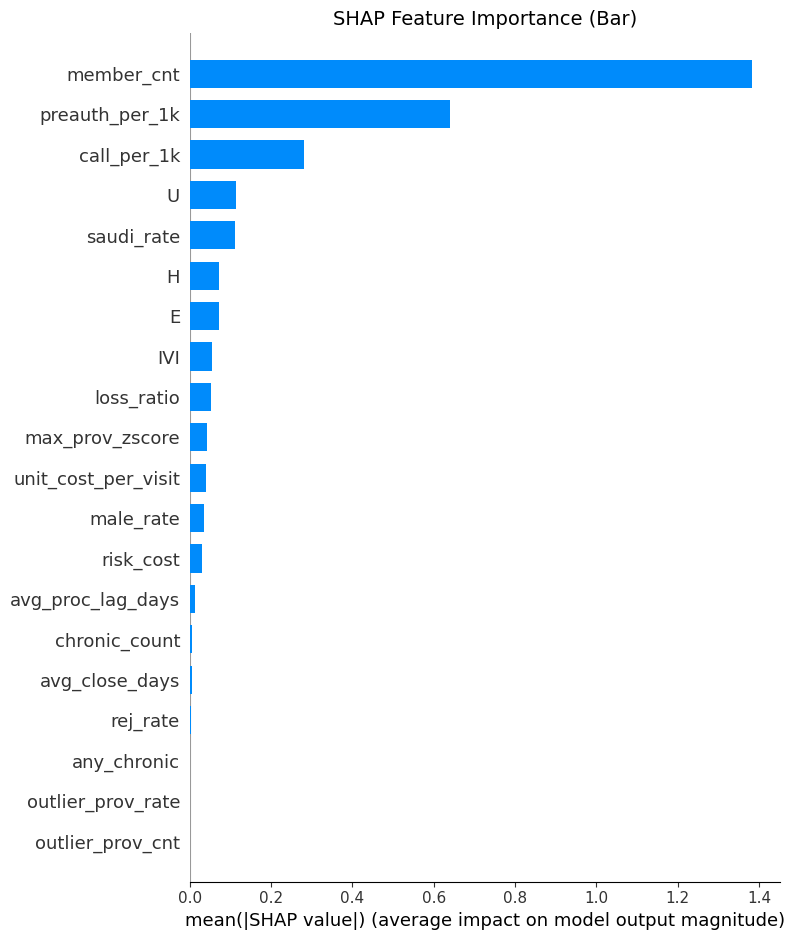

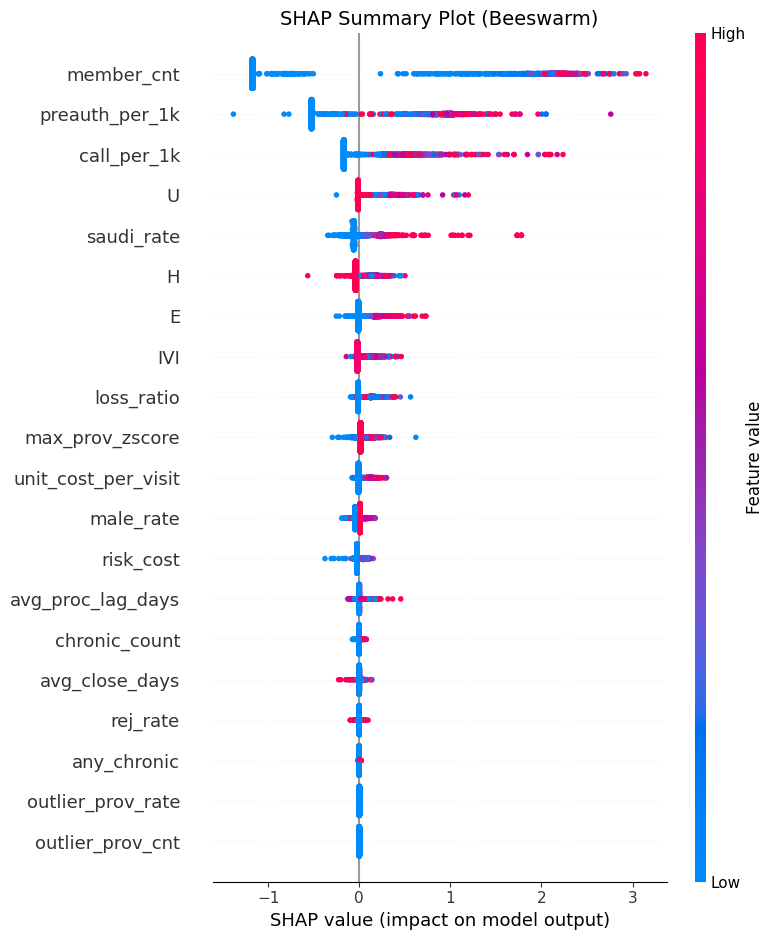

✓ SHAP plots saved to outputs/


In [ ]:
# Install matplotlib if not available and reload shap
import subprocess
import sys
import importlib

try:
    import matplotlib.pyplot as plt
except ImportError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "matplotlib", "-q"])
    import matplotlib.pyplot as plt

# Reload shap to recognize matplotlib
import shap
importlib.reload(shap)

# SHAP Summary Plot (Bar)
fig_shap_bar = plt.figure(figsize=(10, 8))
shap.summary_plot(shap_values, shap_sample, plot_type="bar", show=False)
plt.title("SHAP Feature Importance (Bar)", fontsize=14)
plt.tight_layout()
plt.savefig("outputs/shap_importance_bar.png", dpi=150, bbox_inches='tight')
plt.show()

# SHAP Beeswarm Plot (detailed)
fig_shap_bee = plt.figure(figsize=(10, 8))
shap.summary_plot(shap_values, shap_sample, show=False)
plt.title("SHAP Summary Plot (Beeswarm)", fontsize=14)
plt.tight_layout()
plt.savefig("outputs/shap_summary_beeswarm.png", dpi=150, bbox_inches='tight')
plt.show()

print("✓ SHAP plots saved to outputs/")

## Section 20 · Final Summary & Export

In [ ]:
# ── Final Enhanced Panel Export ──────────────────────────────────────────
print("=" * 60)
print("ENHANCED IVI PIPELINE SUMMARY")
print("=" * 60)

print(f"\n📊 Final Panel Shape: {panel.shape}")
print(f"📈 IVI Score Range: {panel['IVI'].min():.1f} – {panel['IVI'].max():.1f}")
print(f"📉 Mean IVI: {panel['IVI'].mean():.1f}")

# Chronic disease prevalence
chronic_cols = [c for c in panel.columns if c.startswith('chronic_')]
if chronic_cols:
    print(f"\n🏥 Chronic Disease Flags Added: {len(chronic_cols)}")
    for col in chronic_cols:
        pct = panel[col].mean() * 100
        print(f"   - {col}: {pct:.1f}% prevalence")

# Provider outlier prevalence
if 'uses_outlier_provider' in panel.columns:
    outlier_pct = panel['uses_outlier_provider'].mean() * 100
    print(f"\n⚠️ Members using outlier providers: {outlier_pct:.1f}%")

# Risk segmentation
if 'Risk_Segment' in panel.columns:
    print("\n📋 Risk Segmentation:")
    print(panel['Risk_Segment'].value_counts().to_string())

# Model performance
print(f"\n🎯 LightGBM Model Performance:")
print(f"   - AUC-ROC: {lgb_auc:.3f}")
print(f"   - Average Precision: {lgb_ap:.3f}")

# Save enhanced panel
enhanced_output = "outputs/enhanced_contract_month_panel.parquet"
panel.to_parquet(enhanced_output, index=False)
print(f"\n💾 Enhanced panel saved to: {enhanced_output}")

print("\n" + "=" * 60)
print("✅ ENHANCED IVI PIPELINE COMPLETE")
print("=" * 60)

ENHANCED IVI PIPELINE SUMMARY

📊 Final Panel Shape: (143597, 79)
📈 IVI Score Range: 9.3 – 96.0
📉 Mean IVI: 87.3

🏥 Chronic Disease Flags Added: 7
   - chronic_diabetes: 15.5% prevalence
   - chronic_hypertension: 13.2% prevalence
   - chronic_heart: 4.8% prevalence
   - chronic_cancer: 2.9% prevalence
   - chronic_respiratory: 14.7% prevalence
   - chronic_kidney: 1.6% prevalence
   - chronic_count: 52.8% prevalence

⚠️ Members using outlier providers: 0.3%

🎯 LightGBM Model Performance:
   - AUC-ROC: 0.940
   - Average Precision: 0.667

💾 Enhanced panel saved to: outputs/enhanced_contract_month_panel.parquet

✅ ENHANCED IVI PIPELINE COMPLETE


In [ ]:
panel.duplicated().sum()

TypeError: unhashable type: 'list'

In [ ]:
# Check for duplicate rows based on CONT_NO and CONT_YYMM
# (The recommended_actions column contains lists which can't be hashed)
duplicate_count = panel.duplicated(subset=['CONT_NO', 'CONT_YYMM']).sum()
print(f"Number of duplicate contract-month combinations: {duplicate_count}")

# If you want to check all columns except recommended_actions:
cols_to_check = [col for col in panel.columns if col != 'recommended_actions']
duplicate_all = panel.duplicated(subset=cols_to_check).sum()
print(f"Number of fully duplicate rows (excluding actions): {duplicate_all}")

Number of duplicate contract-month combinations: 0
Number of fully duplicate rows (excluding actions): 0
